# A demo using Hydrogen Hamiltonian with GPT-QE.

In [1]:
import json, os, torch
from qwrapper.hamiltonian import compute_ground_state
from qwrapper.obs import PauliObservable
from gqe.mingpt.model import GPT
from gqe.mingpt.trainer import Trainer
from gqe.mingpt.utils import set_seed
from qswift.compiler import DefaultOperatorPool
from benchmark.molecule import DiatomicMolecularHamiltonian
from gqe.mingpt.cost import EnergyCost
from gqe.operator_pool.uccsd import UCCSD, generate_molecule
from gqe.common.initializer import HFStateInitializer
from gqe.mingpt.callback import DefaultCallback, PrintMonitor, FileMonitor

nqubit = 10
n_gates = 40
iter = 500
n_sample = 50
seed = 3047
ignore_cache = True
distances = [1.0, 1.5, 1.57, 2.0, 2.5, 3.0]  # choices of the distance between two atoms
model_type = 'gpt2'
transformation = 'jordan-wigner'
is_bravyi = transformation == 'bravyi-kitaev'
MODEL_FILEBASE = '../saved_models/{}_model_lih_sto3g_{}_{}_{}.json'
TRAJECTORY_FILEBASE = '../output/{}_trajectory_lih_sto3g_{}_{}_{}.txt'
ENERGY_FILEBASE = '../output/{}_energy_lih_sto3g_{}_{}_{}.txt'
OTHER_FILEBASE = '../output/{}_other_lih_sto3g_{}_{}_{}.json'

# Training

In [2]:

def find_ground_state_energy(distance, seed, ignore_cache=False):
    molecule = generate_molecule("Li", "H", distance, "sto-3g", bravyi_kitaev=is_bravyi)
    set_seed(seed)
    # prepare file
    model_output = MODEL_FILEBASE.format(model_type, str(distance), transformation, seed)
    other_output = OTHER_FILEBASE.format(model_type, str(distance), transformation, seed)
    trajectory_output = TRAJECTORY_FILEBASE.format(model_output, str(distance), transformation, seed)

    if not ignore_cache and os.path.exists(model_output):
        return

    # prepare Hamiltonian
    hamiltonian = DiatomicMolecularHamiltonian(nqubit, molecule, bravyi_kitaev=is_bravyi)

    ge = compute_ground_state(hamiltonian)
    print("ground state:", ge)

    # prepare operator_pool
    uccsd = UCCSD(nqubit, molecule)
    paulis = uccsd.paulis
    paulis.append(PauliObservable("IIIIIIIIII"))
    initializer = HFStateInitializer(n_electrons=2)
    print("hf state:", hamiltonian.exact_value(initializer.init_circuit(nqubit, [], "qulacs")))

    pool = DefaultOperatorPool(paulis)
    cost = EnergyCost(hamiltonian, initializer, pool,
                      [0.00625, -0.00625, 0.0125, -0.0125, 0.025, -0.025, 0.05, -0.05, 0.1, -0.1])

    model_config = GPT.get_default_config()
    model_config.model_type = model_type
    model_config.vocab_size = cost.vocab_size()
    model_config.block_size = cost.vocab_size()
    model_config.n_gates = n_gates  # The number of gates for each circuit
    model_config.temperature = 10  # Each gate is generated with probability exp(-temperature * logit)
    model_config.embd_pdrop = 0.1
    model_config.resid_pdrop = 0.1
    model_config.attn_pdrop = 0.1
    model_config.energy_offset = 7
    model = GPT(model_config, cost)

    # create a Trainer object

    train_config = Trainer.get_default_config()
    train_config.learning_rate = 5e-7  # the model we're using is so small that we can go a bit faster
    train_config.max_iters = iter
    train_config.num_workers = 10
    train_config.n_samples = n_sample

    file_monitor = FileMonitor()
    trainer = Trainer(train_config, model)
    trainer.set_callback('on_batch_end',
                         callback=DefaultCallback(model, monitors=[PrintMonitor(), file_monitor]).generate())
    trainer.run()
    torch.save(model.state_dict(), model_output)
    file_monitor.save(trajectory_output)

    m = {"distance": distance,
         "exact_energy": ge,
         "computed_energy": file_monitor.min_energy,
         "computed_indices": file_monitor.min_indices,
         "n_gates": n_gates, "seed": seed}
    with open(other_output, "w") as f:
        f.write(json.dumps(m))


In [3]:
for d in distances:
    find_ground_state_energy(d, seed, ignore_cache=ignore_cache)

converged SCF energy = -7.76736213574856
Starting to parse FermionOperator using 10 qubits...

Operator t:  -5.622343650099325 [] +
-0.002366478148279263 [X0 X1 Y2 Y3] +
0.007237092209030321 [X0 X1 Y2 Z3 Z4 Z5 Z6 Z7 Z8 Y9] +
0.0072370922090303205 [X0 X1 X3 Z4 Z5 Z6 Z7 X8] +
-0.006795526682425188 [X0 X1 Y4 Y5] +
-0.006795526682425188 [X0 X1 Y6 Y7] +
-0.03060391141885277 [X0 X1 Y8 Y9] +
0.002366478148279263 [X0 Y1 Y2 X3] +
-0.007237092209030321 [X0 Y1 Y2 Z3 Z4 Z5 Z6 Z7 Z8 X9] +
0.0072370922090303205 [X0 Y1 Y3 Z4 Z5 Z6 Z7 X8] +
0.006795526682425188 [X0 Y1 Y4 X5] +
0.006795526682425188 [X0 Y1 Y6 X7] +
0.03060391141885277 [X0 Y1 Y8 X9] +
-0.010427380440120232 [X0 Z1 X2] +
0.0012091908976995967 [X0 Z1 X2 X3 Z4 Z5 Z6 Z7 Z8 X9] +
0.0012091908976995967 [X0 Z1 X2 Y3 Z4 Z5 Z6 Z7 Z8 Y9] +
0.00034735301058759873 [X0 Z1 X2 Z3] +
0.00468576105646006 [X0 Z1 X2 Z4] +
-0.000203777657244004 [X0 Z1 X2 Z5] +
0.00468576105646006 [X0 Z1 X2 Z6] +
-0.000203777657244004 [X0 Z1 X2 Z7] +
0.0017860067890504094 [X0

# Figure

In [4]:
min_d = distances[0] - 0.1
max_d = distances[len(distances) - 1] + 0.1
n_bin = 100

xs = []
ys = []
ys3 = []
initializer = HFStateInitializer(n_electrons=2)
for j in range(n_bin):
    d = min_d + (max_d - min_d) / (n_bin - 1) * j
    molecule = generate_molecule("Li", "H", d, "sto-3g", bravyi_kitaev=False)
    hamiltonian = DiatomicMolecularHamiltonian(nqubit, molecule, bravyi_kitaev=False)
    ge = compute_ground_state(hamiltonian)
    scf = hamiltonian.exact_value(initializer.init_circuit(nqubit, [], "qulacs"))
    xs.append(d)
    ys.append(ge)
    ys3.append(scf)


converged SCF energy = -7.70575334013612
Starting to parse FermionOperator using 10 qubits...

Operator t:  -5.590471270972384 [] +
-0.0023216284299956797 [X0 X1 Y2 Y3] +
0.0069430864153938645 [X0 X1 Y2 Z3 Z4 Z5 Z6 Z7 Z8 Y9] +
0.0069430864153938645 [X0 X1 X3 Z4 Z5 Z6 Z7 X8] +
-0.007005064561688982 [X0 X1 Y4 Y5] +
-0.007005064561688982 [X0 X1 Y6 Y7] +
-0.03069977348438742 [X0 X1 Y8 Y9] +
0.0023216284299956797 [X0 Y1 Y2 X3] +
-0.0069430864153938645 [X0 Y1 Y2 Z3 Z4 Z5 Z6 Z7 Z8 X9] +
0.0069430864153938645 [X0 Y1 Y3 Z4 Z5 Z6 Z7 X8] +
0.007005064561688982 [X0 Y1 Y4 X5] +
0.007005064561688982 [X0 Y1 Y6 X7] +
0.03069977348438742 [X0 Y1 Y8 X9] +
-0.011836947632376398 [X0 Z1 X2] +
0.0010528899514043399 [X0 Z1 X2 X3 Z4 Z5 Z6 Z7 Z8 X9] +
0.0010528899514043399 [X0 Z1 X2 Y3 Z4 Z5 Z6 Z7 Z8 Y9] +
0.000863271803663134 [X0 Z1 X2 Z3] +
0.004917722137823536 [X0 Z1 X2 Z4] +
-4.228861883860029e-05 [X0 Z1 X2 Z5] +
0.004917722137823536 [X0 Z1 X2 Z6] +
-4.228861883860029e-05 [X0 Z1 X2 Z7] +
0.00160847853621680

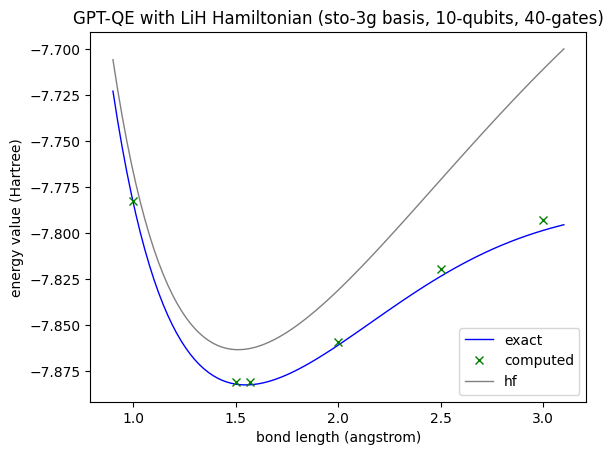

In [9]:
xs2 = []
ys2 = []

for d in distances:
    xs2.append(d)
    with open(OTHER_FILEBASE.format(model_type, d, transformation, seed)) as f:
        ys2.append(json.loads(f.readline())['computed_energy'])

import matplotlib.pyplot as p

# p.grid('-')
p.plot(xs, ys, label='exact', linewidth=1, color='blue')
p.plot(xs2, ys2, label='computed', marker='x', linewidth=0, color='green')
p.plot(xs, ys3, label='hf', linewidth=1, color='gray')
p.xlabel('bond length (angstrom)')
p.ylabel('energy value (Hartree)')
p.title('GPT-QE with LiH Hamiltonian (sto-3g basis, 10-qubits, 40-gates)')
p.legend()
p.show()